---

In [1]:
import json          
import pandas as pd
import matplotlib.pyplot as plt
import sqlite3
import numpy as np
import sys
from pathlib import Path
from rich.console import Console
from bokeh.plotting import output_notebook

import canonical_toolkit as ctk

In [2]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
DATA_FOLDER = None
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [3]:
output_notebook()
console = Console()                                                                                                                                                                                                                                                        
sys.path.insert(0, str(Path.cwd().parent))                                                                                                                                                                                                                                 
from ea.config import Config 

if not DATA_FOLDER:
    df = pd.read_csv('run_history.csv')
    DATA_FOLDER = df['output_folder'].iloc[-1]

print(DATA_FOLDER)
data = pd.read_sql("SELECT * FROM individual", sqlite3.connect(f"{DATA_FOLDER}/database.db"))
config = Config.load(DATA_FOLDER)
config.large_description()

Loading BokehJS ...

__data__/testing


                                              EA Configuration (Full)                                              
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Setting            ┃ Value                                                                    ┃ Type            ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ SEED               │ 1                                                                        │ int             │
│ RUN_NAME           │ run                                                                      │ str             │
│ QUIET              │ ✗                                                                        │ bool            │
│ LOG_LEVEL          │ INFO                                                                     │ <enum 'LogLevel │
│ STORE_IMG          │ ✓                                                                        │ bool            │
│ NUM_MODULES        │ 20                                                                       │ int             │
│ GENOTYPE_SIZE      │ 64                                                                       │ int             │
│ SCALE              │ 8192.0                                                                   │ float           │
│ REV_SCALING_FACTOR │ -0.5                                                                     │ float           │
│ POPULATION_SIZE    │ 10                                                                       │ int             │
│ NUM_GENERATIONS    │ 10                                                                       │ int             │
│ IS_MAXIMISATION    │ ✓                                                                        │ bool            │
│ PENALTY            │ ✗                                                                        │ bool            │
│ FITNESS_NOVELTY    │ ✓                                                                        │ bool            │
│ FITNESS_SPEED      │ ✓                                                                        │ bool            │
│ STORE_NOVELTY      │ ✓                                                                        │ bool | None     │
│ STORE_SPEED        │ ✓                                                                        │ bool | None     │
│ TOTAL_SIM_DURATION │ 90.0                                                                     │ float           │
│ SIM_WARMUP         │ 60.0                                                                     │ float           │
│ TOURNAMENT         │ ✓                                                                        │ bool            │
│ K_TOURNAMENT       │ 2                                                                        │ int             │
│ STORE_SPACES       │ ['R_f__', 'R_l__', 'R_b__', 'R_r__', 'A_t__', 'A_b__', 'R_#__', 'A_#__', │ list            │
│                    │ '']                                                                      │                 │
│ NOVELTY_SPACES     │ ['']                                                                     │ list | None     │
│ MAX_HOP_RADIUS     │ None                                                                     │ int | None      │
│ K_NOVELTY          │ 1                                                                        │ int             │
│ ARCHIVE_CHANCE     │ 0.1                                                                      │ float           │
│ OUTPUT_FOLDER      │ __data__/testing                                                         │ pathlib.Path    │
└────────────────────┴──────────────────────────────────────────────────────────────────────────┴─────────────────┘

In [4]:
tags_expanded = data['tags_'].apply(lambda x: json.loads(x) if isinstance(x, str) else x).apply(pd.Series)                                        
data = pd.concat([data, tags_expanded], axis=1)                                                                                                   
                                                                                                                                                                                                                                                     
data['gen'] = data.apply(                                                                                                                         
    lambda row: list(range(int(row['time_of_birth']), int(row['time_of_death']) + 1)),                                                            
    axis=1                                                                                                                                        
)   
                                                                                                                                              
gen_df = (data                                                                                                                                                     
    .explode('gen')                                                                                                                                                
    .rename(columns={'fitness_': 'fitness', 'genotype_': 'genotype', 'tags_': 'tags'})                                                                             
    .sort_values(['gen', 'ctk_string'], ascending=[True, True])                                                                                                    
)                                                                                                                                               
                                                                                                                                                
# Add rank within each generation                                                                                                                 
gen_df['rank'] = gen_df.groupby('gen').cumcount()                                                                                                                  
gen_df = gen_df.set_index(['gen', 'rank'])
gen_df.head()

id  alive  time_of_birth  time_of_death  requires_eval  \
gen rank                                                           
0   0      4      0              0              2              0   
    1      2      0              0              1              0   
    2      8      0              0              1              0   
    3     10      0              0              4              0   
    4      1      0              0              1              0   

               fitness  requires_init  \
gen rank                                
0   0     1.810881e-16              0   
    1     3.136284e-08              0   
    2     2.167117e-04              0   
    3     1.981256e-06              0   
    4     4.166556e-05              0   

                                                   genotype  \
gen rank                                                      
0   0     [[3694.7179406334126, -264.7435754879898, 4708...   
    1     [[-2249.574693964212, 4272.763446615778, -7758...   
    2     [[841.6469899332151, -5151.460712728447, -6700...   
    3     [[1676.1964447247865, -7610.79354894644, -1188...   
    4     [[193.68549908900604, 7380.397200604124, -5830...   

                                                       tags  \
gen rank                                                      
0   0     {"ctk_string": "C<b(B1)t(B5[t(B3[r(BH3H)]H7)l(...   
    1     {"ctk_string": "C<t(B3H4)b(B3[t(B5[r(B3[r(B)]H...   
    2     {"ctk_string": "C[f(B)l(B4[r(B5)]B2[t(B4[t(B6)...   
    3     {"ctk_string": "C[f(H3H4H7H7)]<b(B5[r(B3H4H)]B...   
    4     {"ctk_string": "C[f(H5)]<t(B5[r(B1)]B[t(B1)b(B...   

                                                 ctk_string  \
gen rank                                                      
0   0           C<b(B1)t(B5[t(B3[r(BH3H)]H7)l(B4[r(B2)])])>   
    1      C<t(B3H4)b(B3[t(B5[r(B3[r(B)]H6HB6)]HH2H5)]HH4)>   
    2     C[f(B)l(B4[r(B5)]B2[t(B4[t(B6)]B3B1H5B5H7H7H3)])]   
    3       C[f(H3H4H7H7)]<b(B5[r(B3H4H)]BB1B3[l(B5H2)]H1)>   
    4     C[f(H5)]<t(B5[r(B1)]B[t(B1)b(B3B3[r(B)])]H1H6H...   

                                                      image   novelty  \
gen rank                                                                
0   0     data:image/webp;base64,UklGRhQCAABXRUJQVlA4WAo...  0.896608   
    1     data:image/webp;base64,UklGRjYDAABXRUJQVlA4WAo...  0.902564   
    2     data:image/webp;base64,UklGRjQDAABXRUJQVlA4WAo...  0.911500   
    3     data:image/webp;base64,UklGRnwDAABXRUJQVlA4WAo...  0.902564   
    4     data:image/webp;base64,UklGRrQCAABXRUJQVlA4WAo...  0.906255   

                 speed archived  
gen rank                         
0   0     2.019702e-16      NaN  
    1     3.474860e-08      NaN  
    2     2.377528e-04      NaN  
    3     2.195142e-06      NaN  
    4     4.597551e-05      NaN

---

### Plot fitness + 'stored values'

In [5]:
from ea.analysis.plot_metrics import plot_metrics

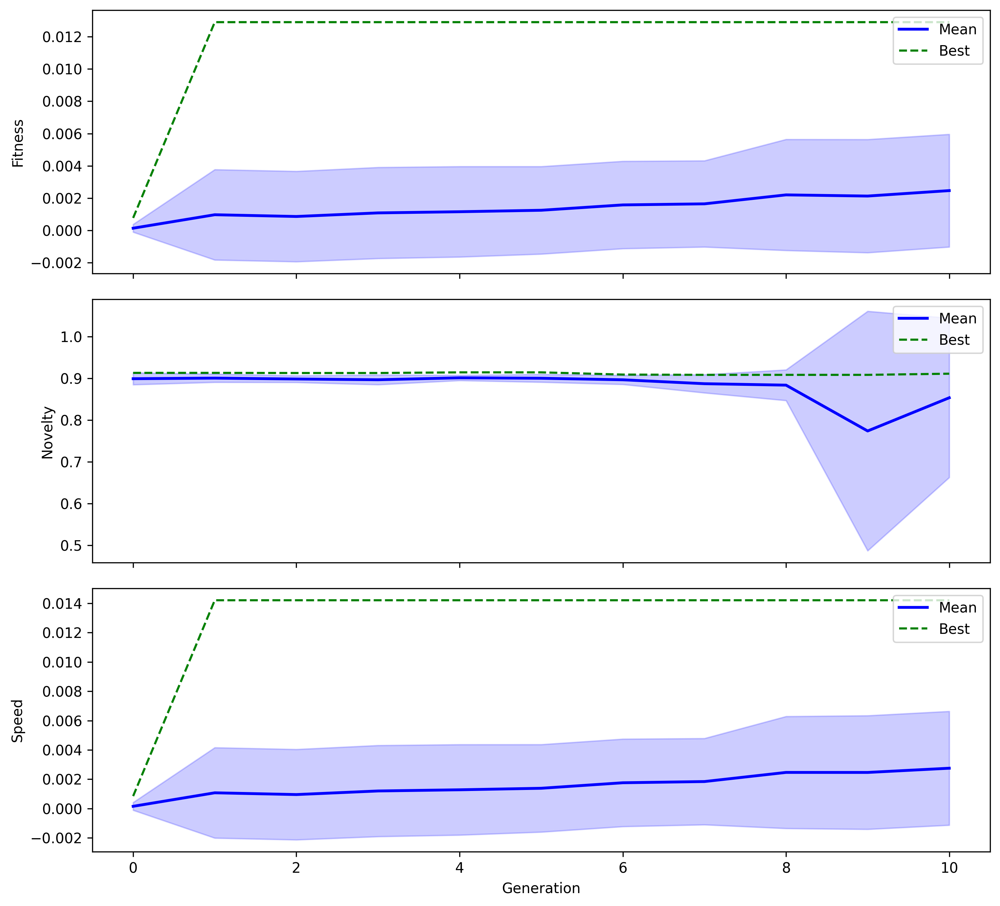

In [6]:
to_plot = ['fitness']
if config.STORE_NOVELTY:
    to_plot.append('novelty')
if config.STORE_SPEED:
    to_plot.append('speed')
                                                                                                                                                                
plot_metrics(gen_df, metrics=to_plot, is_max=config.IS_MAXIMISATION)  

### Livespan Fittest Individuals

In [7]:
from ea.analysis.plot_top_lifespans import plot_top_lifespans                                                                                                                               

In [8]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
column = 'fitness'
top_x = 10
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

(<Figure size 6000x2400 with 1 Axes>,
 <Axes: title={'center': 'Individuals Ever in Top 10 (in top 10 that gen)'}, xlabel='Generation', ylabel='fitness'>)

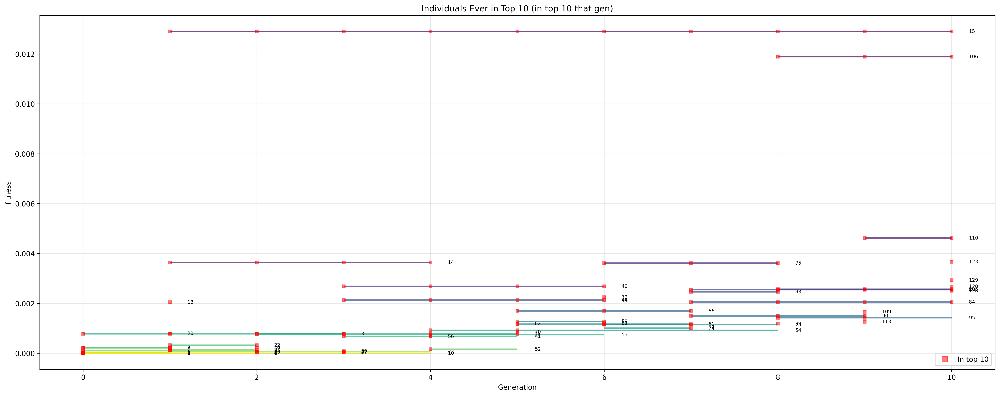

In [9]:
plot_top_lifespans(gen_df, is_maximalisation=config.IS_MAXIMISATION, column=column, top_x=top_x)

In [10]:
from ea.analysis.plot_lifespan_analysis import plot_lifespan_analysis

In [11]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
fitness_lim = (
    0, 
    0.01
)
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

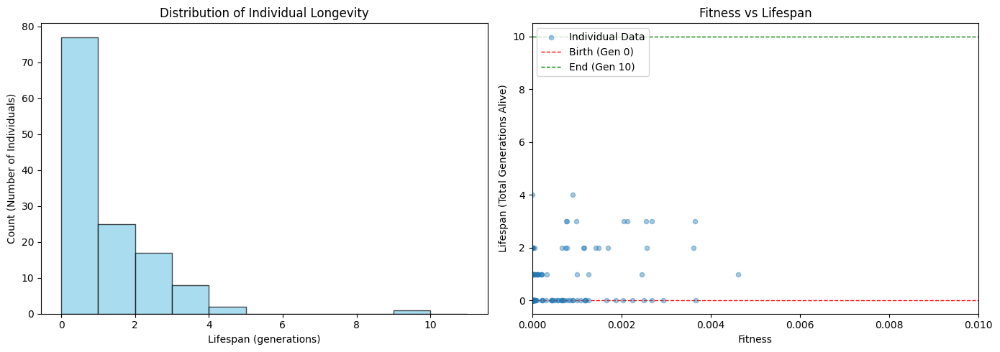

In [12]:
plot_lifespan_analysis(gen_df, fitness_xlim=fitness_lim)

---

### Quick Dirty Robot Generation Plotter

In [13]:
from IPython.display import HTML                                                                                                                                           

In [14]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
plot_generation = 0
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

plotting generation 0



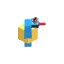
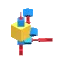
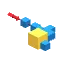
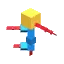
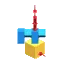
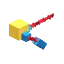
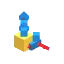
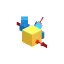
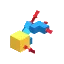
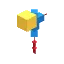

In [15]:
html = "<div style='display:flex;flex-wrap:wrap;gap:4px'>"                                                                                                                 
for _, row in gen_df.loc[plot_generation].iterrows():                                                                                                                                  
    html += f'<img src="{row["image"]}" title="fit={row["fitness"]:.2f}" style="height:64px">'                                                                             
html += "</div>"  

print(f'plotting generation {plot_generation}')
plot_generation = (plot_generation + 1) % config.NUM_GENERATIONS                                                                                                                                                         
HTML(html)  


In [16]:
from ea.analysis.high_res_robot_gens import high_res_robot_gens

In [17]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
amt = 2
gen_samples = 5
# or fitness/ novelty
col_name = 'speed'
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

plot fittest

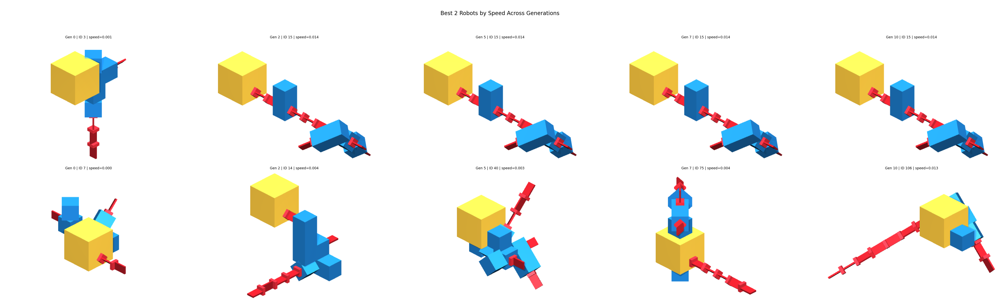

In [18]:
plotter = high_res_robot_gens(gen_df, config, top_n=amt, n_samples=gen_samples, by=col_name)                                                                                             
plotter.show()    

plot least fit

In [19]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
amt = 2
gen_samples = 5
# or fitness/ novelty
col_name = 'speed'
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

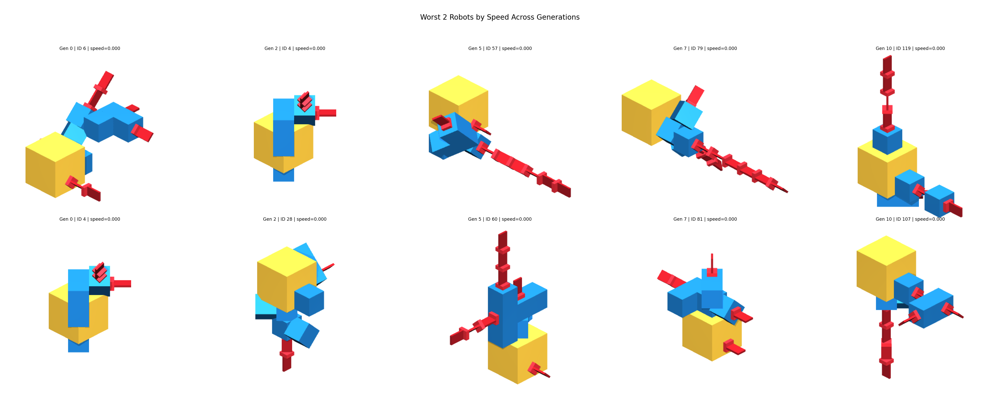

In [20]:
plotter = high_res_robot_gens(gen_df, config, top_n=-amt, n_samples=gen_samples, by=col_name) # multiplies top with -1 to get the least fit                                                                                         
plotter.show()    

---

### Similarity Frame analysis

In [21]:
# # ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# # evenly spaced out generations like before
# num_generations: int | None = 5 
# max_radius = None
# # ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [22]:
frame_folders = sorted((config.OUTPUT_FOLDER / "feature_frames").glob("gen_*"))
all_feature_frames = [ctk.SimilarityFrame.load(f) for f in frame_folders]

### Heatmaps

radius cosine heatmap across spaces. show 1 GENERATION

In [23]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
generation = 0
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [24]:
heat_map_show = all_feature_frames[generation].map('cosine_similarity', inplace=False)

In [25]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
interactive = True
cell_size = 150
# Select what area/ to plot with slicing
heat_map_show = heat_map_show[:,::-1] 

# [OPTIONAL] Show the cumulative sum across radii
# heat_map_show.to_cumulative(inplace=False)

# [OPTIONAL] Show what happens when aggregating
# heat_map_show = ctk.SimilarityFrame([heat_map_show.aggregate()])
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [26]:
print(heat_map_show)

                                           SimilarityFrame (9 series × 13 indices)                                            
┏━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Index ┃   WHOLE    ┃   AXIAL    ┃   RADIAL   ┃   BOTTOM   ┃    TOP     ┃   RIGHT    ┃    BACK    ┃    LEFT    ┃   FRONT    ┃
┡━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│     0 │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │
│     1 │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │    ...     │    ...     │ [10×10] Dn │ [10×10] Dn │
│     2 │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │    ...     │    ...     │ [10×10] Dn │ [10×10] Dn │
│     3 │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │    ...     │    ...     │ [10×10] Dn │ [10×10] Dn │
│     4 │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │    ...     │    ...     │ [10×10] Dn │ [10×10] Dn │
│     5 │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │    ...     │    ...     │ [10×10] Dn │ [10×10] Dn │
│     6 │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │    ...     │    ...     │ [10×10] Dn │    ...     │
│     7 │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │    ...     │    ...     │ [10×10] Dn │    ...     │
│     8 │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │ [10×10] Dn │    ...     │    ...     │    ...     │ [10×10] Dn │    ...     │
│     9 │ [10×10] Dn │    ...     │ [10×10] Dn │    ...     │    ...     │    ...     │    ...     │ [10×10] Dn │    ...     │
│    10 │ [10×10] Dn │    ...     │ [10×10] Dn │    ...     │    ...     │    ...     │    ...     │ [10×10] Dn │    ...     │
│    11 │ [10×10] Dn │    ...     │ [10×10] Dn │    ...     │    ...     │    ...     │    ...     │    ...     │    ...     │
│    12 │ [10×10] Dn │    ...     │ [10×10] Dn │    ...     │    ...     │    ...     │    ...     │    ...     │    ...     │
└───────┴────────────┴────────────┴────────────┴────────────┴────────────┴────────────┴────────────┴────────────┴────────────┘

In [33]:
data_2d = [
    [inst.matrix for inst in serie.instances] 
    for serie in heat_map_show.series
]
id_map = gen_df.loc[generation, 'id'].to_dict()
titles = [
    [f"{serie.label} - Radius {inst.radius}" for inst in serie.instances]
    for serie in heat_map_show.series 
]
real_ids = [
    [
        [
            [(id_map[i], id_map[j]) for j in range(inst.shape[1])] 
            for i in range(inst.shape[0])
        ]
        for inst in serie.instances
    ]
    for serie in heat_map_show.series
]
if interactive:
    plotter = ctk.BokehGridPlotter()
    plotter.add_thumbnails(ids=gen_df['id'], b64s=gen_df['image'])
    plotter.config.plot_width = cell_size
    plotter.config.plot_height = cell_size
    plotter.add_2D_numeric_data(
        data_2d=data_2d,
        global_ids_2d=real_ids,
        titles_2d=titles
    )
    plotter.transpose()
else:
    plotter = ctk.GridPlotter()
    plotter.add_2D_numeric_data(
        data_2d=data_2d,
        titles_2d=titles    
    )
plotter.show()

radius cosine heatmap across GENERATIONS. show 1 RADIUS

In [34]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# evenly spaced out generations like before
num_generations: int | None = 5 
radius = 3
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [35]:
cosine_generation_frames = [
    all_feature_frames[i].map('cosine_similarity', inplace=False) 
    for i in np.linspace(0, config.NUM_GENERATIONS, num=num_generations, dtype=int)
]

In [36]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
interactive = True
cell_size = 150
# Select what area/ to plot with slicing
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [48]:
# Process all generations
gen_indices = np.linspace(0, config.NUM_GENERATIONS, num=num_generations, dtype=int)
target_r = 3

# Chain: Map cosine similarity, then safely pick the best radius for each series
sliced_frames = [
    all_feature_frames[i].map('cosine_similarity', inplace=False).map(
        lambda s: s[min(target_r, max(s.radii))]
    )
    for i in gen_indices
]

In [49]:
# Grid [Space][Generation]
# f[s] returns a Matrix (the result of the lambda slice)
data_2d = [[f[s].matrix for f in sliced_frames] for s in spaces]

# Extract titles and actual radii used
titles = [[f"{s} (Gen {g}) - R{f[s].radius}" for g in gen_indices] for s in spaces]

# Safe ID mapping
real_ids = [
    [
        [[(id_maps[g][i], id_maps[g][j]) for j in range(f[s].shape[1]) if j in id_maps[g]]
          for i in range(f[s].shape[0]) if i in id_maps[g]]
        for f, g in zip(sliced_frames, gen_indices)
    ] for s in spaces
]
if interactive:
    plotter = ctk.BokehGridPlotter()
    plotter.add_thumbnails(ids=gen_df['id'], b64s=gen_df['image'])
    plotter.config.plot_width = cell_size
    plotter.config.plot_height = cell_size
    plotter.add_2D_numeric_data(
        data_2d=data_2d,
        global_ids_2d=real_ids,
        titles_2d=titles
    )
    plotter.transpose()
else:
    plotter = ctk.GridPlotter()
    plotter.add_2D_numeric_data(
        data_2d=data_2d,
        titles_2d=titles    
    )
plotter.show()

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:6                                                                                    │
│                                                                                                  │
│    3 data_2d = [[f[s].matrix for f in sliced_frames] for s in spaces]                            │
│    4                                                                                             │
│    5 # Extract titles and actual radii used                                                      │
│ ❱  6 titles = [[f"{s} (Gen {g}) - R{f[s].radius}" for g in gen_indices] for s in spaces]         │
│    7                                                                                             │
│    8 # Safe ID mapping                                                                           │
│    9 real_ids = [                                                                                │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
NameError: name 'f' is not defined

radius cosine heatmap across GENERATIONS. show 1 SPACE

### UMAP

In [ ]:
#TODO I want to test the differences between the 2
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
umap_config = ctk.UmapConfig(
    n_neighbors=2,
    metric='precomputed',
    n_jobs=-1
)
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [ ]:
all_umap_frames = [frame.map('umap_embed', config=config, inplace=False) for frame in all_cosine_frames]

In [ ]:
if interactive:
    # bokeh plotter
    

else:
    # grid plotter
